##### Data (。_ 。)

In [50]:
#librerias
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt

import os
import json
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# mapas interactivos
import folium
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap

#to make the plotly graphs
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly.offline import iplot, init_notebook_mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)
import plotly.express as px

#text mining
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from wordcloud import WordCloud


In [51]:
listings = pd.read_csv("listings.csv", index_col= "id")
listings_d = pd.read_csv("Input/listings.csv", index_col= "id", low_memory=False)
calendar = pd.read_csv("Input/calendar.csv", parse_dates=['date'], index_col=['listing_id'])
reviews = pd.read_csv("reviews.csv", parse_dates=['date'])
reviews_web = pd.read_csv("Input/reviews.csv", parse_dates=['date'])
neighbourhoods = pd.read_csv("Input/neighbourhoods.csv", parse_dates=['neighbourhood_group'])

C:\Users\anapa\AppData\Local\Temp\ipykernel_12924\790501463.py:6: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [52]:
prueb=pd.DataFrame()
l=pd.DataFrame(listings_d['listing_url'])
l.reset_index(inplace=True)
l.drop('listing_url',axis=1,inplace=True)

In [53]:
listings_d['listing_id']=l['id']
listings_d.reset_index(inplace=True)
listings_d['listing_id']

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
7403   NaN
7404   NaN
7405   NaN
7406   NaN
7407   NaN
Name: listing_id, Length: 7408, dtype: float64

In [54]:
listings_d.drop('listing_id',axis=1,inplace=True)
listings_d=listings_d.rename(columns={'id': 'listing_id'})

In [55]:
target_columns = ['host_id','host_location' , 'host_is_superhost' , 'host_listings_count','host_total_listings_count','neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'property_type', 'accommodates', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy','review_scores_cleanliness', 'review_scores_location','review_scores_value', 'review_scores_checkin','review_scores_communication','host_response_time', 'host_response_rate', 'host_acceptance_rate','scrape_id','listing_id']
listings = pd.merge(listings, listings_d[target_columns], on='host_id', how='left')
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111066 entries, 0 to 111065
Data columns (total 38 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   name                            111066 non-null  object 
 1   host_id                         111066 non-null  int64  
 2   host_name                       111066 non-null  object 
 3   neighbourhood_group             111066 non-null  object 
 4   neighbourhood                   111066 non-null  object 
 5   latitude                        111066 non-null  float64
 6   longitude                       111066 non-null  float64
 7   room_type                       111066 non-null  object 
 8   price                           111066 non-null  int64  
 9   minimum_nights                  111066 non-null  int64  
 10  number_of_reviews_x             111066 non-null  int64  
 11  last_review                     100871 non-null  object 
 12  reviews_per_mont

In [56]:
dfs = [listings,calendar, reviews,reviews_web,neighbourhoods]

In [57]:
def replace_missing_data(df):
# Vemos qué columnas tienen valores nulos
   mis_cols = list(df.isnull().sum(axis=0)[df.isnull().sum(axis=0)>0].index)
# Iteramos sobre ellas
   for col in mis_cols:
       # Si la variable es discreta,...
       if df[col].dtype in ['object']:
           mode_col = df[col].mode().values[0]
           df[col] = df[col].fillna(mode_col)
       # Si son números enteros
       elif df[col].dtype in ['int']:
           df[col] = df[col].fillna(df[col].median())
       # Si son números reales
       elif df[col].dtype in ['float']:
           df[col] = df[col].fillna(df[col].mean())
   return df

In [58]:
for i in dfs:
    replace_missing_data(i)

In [59]:
feqq = listings[listings['accommodates']==4]
feqq = feqq.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=True)
adam = gpd.read_file("Input/neighbourhoods.geojson")
feq = feqq.transpose()
adam = pd.merge(adam, feq, on='neighbourhood_group', how='left')
adam.rename(columns={'price': 'average_price'}, inplace=True)
adam.average_price = adam.average_price.round(decimals=2)

map_dict = adam.set_index('neighbourhood')['average_price'].to_dict()
color_scale = LinearColormap(['yellow','red'], vmin = min(map_dict.values()), vmax = max(map_dict.values()))

def get_color(feature):
    value = map_dict.get(feature['properties']['neighbourhood'])
    if value is not None:
        return color_scale(value)
    else:
        return 'grey'

In [60]:
# Calendar
calendar['price'] = calendar['price'] .str.replace('$', '')
calendar['price']= calendar['price'].str.replace(",","")
calendar['price']  = pd.to_numeric(calendar['price'] )

calendar['adjusted_price'] = calendar['adjusted_price'] .str.replace('$', '')
calendar['adjusted_price']= calendar['adjusted_price'].str.replace(",","")
calendar['adjusted_price']  = pd.to_numeric(calendar['adjusted_price'] )

df_c = calendar[(calendar['date'] >= '2023-12-24') & (calendar['date'] <= '2024-01-03') & (calendar['available'] == 't') & (calendar['adjusted_price'] >=100) & (calendar['adjusted_price'] <=140) & (calendar['minimum_nights'] >=4)]
df_c.reset_index(inplace=True)

In [12]:
reviews_web = pd.merge(reviews_web, listings[['host_id', 'host_name', 'name','listing_id']], on = "listing_id", how = "left" )
reviews_web= reviews_web.set_index('id')
reviews_web = reviews_web[['listing_id', 'name', 'host_id', 'host_name', 'date', 'reviewer_id', 'reviewer_name', 'comments']]

In [13]:
host_reviews = reviews_web.groupby(['host_id', 'host_name']).size().sort_values(ascending=False).to_frame(name = "number_of_reviews")

In [14]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\anapa\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [15]:
#take out empty comments (530)
reviews_web = reviews_web[reviews_web['comments'].notnull()]
#remove numbers
reviews_web['comments'] = reviews_web['comments'].str.replace('\d+', '') 
#all to lowercase
reviews_web['comments'] = reviews_web['comments'].str.lower()
#remove windows new line
reviews_web['comments'] = reviews_web['comments'].str.replace('\r\n', "")
#remove stopwords (from nltk library)
stop_english = stopwords.words("english")
reviews_web['comments'] = reviews_web['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_english)]))
#remove stopwords (from nltk library)
stop_spanish = stopwords.words("spanish")
reviews_web['comments'] = reviews_web['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_spanish)]))
#remove stopwords (from nltk library)
stop_french = stopwords.words("french")
reviews_web['comments'] = reviews_web['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_french)]))
#remove stopwords (from nltk library)
stop_german = stopwords.words("german")
reviews_web['comments'] = reviews_web['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_german)]))
# remove punctuation
reviews_web['comments'] = reviews_web['comments'].str.replace('[^\w\s]'," ")
# replace x spaces by one space
reviews_web['comments'] = reviews_web['comments'].str.replace('\s+', ' ')

reviews_web.comments.values[2] #print same comments again

'staying irina great! stayed two nights semana santa arrival 4am could issue places problem! irina breakfast meal us days unexpected amazing her! key could come go please helpful. irina great giving us advice go short stay sevilla. hope visit soon see more!'

In [ ]:
texts = reviews_web.comments.tolist()

vec = CountVectorizer().fit(texts)
bag_of_words = vec.transform(texts)
sum_words = bag_of_words.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]

cvec_df = pd.DataFrame.from_records(words_freq, columns= ['words', 'counts']).sort_values(by="counts", ascending=False)

In [115]:
cvec_df = cvec_df.iloc[1:]

In [116]:
cvec_df.head()

,words,counts
123,apartment,2081446
0,great,1875856
1,location,1687836
95,stay,1278485
141,place,1150479


In [17]:
ok={
    'Anho':[2022,2021,2020,2019,2018],
    'Hurtos':[24400,18880,16081,26352,24749],
    'Robos con fuerza en viviendas':[2779.0,2565.0,2966.0,3658.0,3458.0],
    'Robos con violencia o intimidacion':[2455.0,1937.0,1802.0,2437.0,2413.0],
    'Robos con violencia en via publica':[1763.0,1328.0,1208.0,1660.0,1693.0]
}
crim=pd.DataFrame(ok)
crim

,Anho,Hurtos,Robos con fuerza en viviendas,Robos con violencia o intimidacion,Robos con violencia en via publica
0,2022,24400,2779.0,2455.0,1763.0
1,2021,18880,2565.0,1937.0,1328.0
2,2020,16081,2966.0,1802.0,1208.0
3,2019,26352,3658.0,2437.0,1660.0
4,2018,24749,3458.0,2413.0,1693.0


In [18]:
#listings.drop('name',axis=1,inplace=True)

#### Sevilla (͠≖ ͜ʖ͠≖)👌

Sevilla es un destino turístico muy valorado por su clima, su gente y su patrimonio cultural. Es la tercera ciudad española más visitada después de Madrid y Barcelona.

Sevilla , una joya en el corazón de España que deslumbra a los visitantes con su rica historia, vibrante cultura y espectaculares paisajes. Situada en la región de Andalucía, es una ciudad que combina la grandeza de su pasado con la vitalidad de su presente.  Sevilla es un destino imperdible para cualquier viajero que busque sumergirse en la historia, la arquitectura impresionante y la pasión desbordante que la caracterizan. Desde sus monumentos icónicos hasta sus tradiciones culturales, esta ciudad tiene mucho que ofrecer a aquellos que desean descubrir la esencia de España. 
Tras el descubrimiento de América en 1492, Sevilla se convirtió en el centro económico del Imperio español. Los Reyes Católicos fundaron la Casa de Contratación, desde donde se dirigían y contrataban los viajes, controlaban las riquezas que entraban de América y, junto con la Universidad de Mercaderes, regulaban las relaciones con el Nuevo Mundo




<img src="Img/Flag_of_Sevilla_Spain.png">
 
 
 imagen tomada desde : "https://www.headout.com/"

 ##### Sus principales atractivos turísticos son :

##### El Real Alcázar de Sevilla: Conjunto palaciego amurallado construido en diferentes etapas históricas. El palacio original se edificó en la Alta Edad Media. Se conservan algunos vestigios de arte islámico y, de la etapa posterior a la conquista castellana, un espacio palaciego mudéjar y otro de estilo gótico. En reformas posteriores se añadieron elementos renacentistas, manieristas​ y barrocos​


<img src="Img\alcazar de sevilla (headout.com).avif">
 
 
 imagen tomada desde : "https://www.headout.com/"

##### La Plaza de España: Es un conjunto arquitectónico enclavado en el parque de María Luisa . Fue proyectada por el arquitecto Aníbal González y se levantó entre 1914 y 1929 .  Constituye el edificio más grande de todos los que se levantaron en la ciudad durante el siglo xx, comparable a las otras dos construcciones históricas destacadas de los extramuros de la ciudad, que son el hospital de las Cinco Llagas (siglo xvi) y la Real Fábrica de Tabacos (siglo xviii)


<img src="Img/Plazanew(Diario de sevilla).jpg">
 
 
 imagen tomada desde : "https://www.diariodesevilla.es/"

##### Catedral de Santa María de la Sede :  Es un templo católico de estilo gótico. La Unesco la declaró en 1987, junto al Real Alcázar y el Archivo de Indias, Patrimonio de la Humanidad . El templo acoge los restos mortales de Cristóbal Colón y de varios reyes de Castilla: Pedro I el Cruel, Fernando III el Santo 



<img src="Img\Catedral().avif">
 
 
 imagen tomada desde : "https://www.tiqets.com/"

##### La Torre del Oro : Una torre albarrana situada en el margen oriental del río Guadalquivir. Su origen es una construcción almohade de entre 1220 y 1221​, aunque el segundo cuerpo fue construido por Pedro I a mediados del siglo xiv y el tercer cuerpo fue construido en 1760 . Desde 1944 alberga el Museo Naval de Sevilla



<img src="Img\arenal-torre-del-oro (barcelo.com).jpg">
 
 
 imagen tomada desde : "https://www.barcelo.com/"

##### las Setas de Sevilla:  Ubicada en la céntrica plaza de la Encarnación , la estructura se corona con una terraza y un mirador que ofrece una vista panorámica del casco antiguo de la ciudad.



<img src="Img\Setas de Sevilla(Trip Advisor).jpg">
 
 
 imagen tomada desde : "https://www.tripadvisor.es/"

#### About Sevilla ヾ(⌐■_■)ノ€

In [112]:
#Numero de alistados por grupos de barrios
feq=listings['neighbourhood_group'].value_counts().sort_values(ascending=True)
px.bar(feq, orientation='h',title = "Numeros de alojados por grupo de barrios",template= "plotly_dark")

In [109]:
#numero de alistados dentro de las zonas de Triada y Casco Antiguo
df_gb= listings[(listings['neighbourhood_group'] == "Casco Antiguo") | (listings['neighbourhood_group'] == "Triana") ]
px.bar(df_gb['neighbourhood'].value_counts().sort_values(ascending=True), orientation='h', title = "Numero de alojados por barrios en el Casco Antiguo y la Triana", template= "plotly_dark")

In [94]:
#Mapa de alistados en Casco Antiguo y Triada
lats = df_gb['latitude'].tolist()
lons = df_gb['longitude'].tolist()
locations = list(zip(lats, lons))
map1 = folium.Map(location=[37.389092, -5.984459], zoom_start=14)
FastMarkerCluster(data=locations).add_to(map1)
map1

In [95]:
#Sitios Importantes dentro de estos barrios que los hacen tan demandados para hospedarse cerca
folium.Marker([37.385742, -5.993096], popup='Catedral de Sevilla').add_to(map1)
folium.Marker([37.383394, -5.990524], popup='Real Alcázar de Sevilla').add_to(map1)
folium.Marker([37.38614, -5.99238], popup='Giralda').add_to(map1)
folium.Marker([	37.385, -5.990278], popup='Barrio de Santa Cruz').add_to(map1)
folium.Marker([37.384778, -5.993083], popup='Archivo de Indias').add_to(map1)
folium.Marker([37.393253, -5.991881], popup='Setas de Sevilla').add_to(map1)
folium.Marker([37.392654, -6.000126], popup='Museo de Bellas Artes de Sevilla').add_to(map1)
folium.Marker([37.382455, -5.996296], popup='Torre del Oro').add_to(map1)
folium.Marker([37.385959, -5.998407], popup='Plaza de Toros de la Maestranza').add_to(map1)
folium.Marker([37.386244, -6.002397], popup='Puente de Triana').add_to(map1)
folium.Marker([37.385238, -5.990111], popup='Hospital de los Venerables').add_to(map1)
folium.Marker([37.375741, -5.988889], popup='Parque de María Luisa').add_to(map1)
folium.Marker([37.37708,  -5.986901], popup='Plaza de España').add_to(map1)
folium.Marker([37.3986,  -5.99381],popup='Alameda de Hércules').add_to(map1)
folium.Marker([37.39838,  -5.98831],popup='Iglesia de San Luis de los Franceses').add_to(map1)
folium.Marker([37.40833, -6.00028], popup='Isla Magica').add_to(map1)
map1

Precio medio Por barrios 

In [96]:
#Media de precios
fig = px.choropleth_mapbox(adam, geojson=adam, featureidkey='properties.neighbourhood',locations ="neighbourhood",color = 'average_price', 
                            color_continuous_scale="Oryel", title="Media de precios por barrios en Sevilla",zoom=10, hover_data = ['neighbourhood_group','average_price'],
                            mapbox_style="carto-positron",width=1000, height=750,center = {"lat": 37.389092,  "lon": -5.984459})
fig.update(layout_coloraxis_showscale=True)
fig.update_layout( paper_bgcolor="#1f2630",font_color="white",title_font_size=20, title_x = 0.5)
fig.show()

Tipos de habitaciones

In [97]:
#Tipos de habitaciones
px.histogram(df_gb,'room_type',title='Tipos de habitaciones ',nbins = 20,color='room_type',template= "plotly_dark")

In [98]:
# Alojados 4
alojados=df_gb['accommodates'].value_counts().sort_index()
px.bar(alojados,title= "Media de Alojados en  Sevilla",template= "plotly_dark", labels=dict(index="Accomodates",value="Listings"), width = 1000)

PROPIEDADES DE MONTILLA 

In [99]:
#Mapa las propiedades de Montilla

#Montilla
private = df_gb[df_gb['room_type'] == "Private room"]
host_private = private.groupby(['host_id', 'host_name', 'neighbourhood']).size().reset_index(name='private_rooms').sort_values(by=['private_rooms'], ascending=False)
host_private.head()

# Montilla room
Montilla= private[private['host_id']== 162000389]
Montilla= Montilla[['name','host_id', 'host_name', 'latitude', 'longitude']]
Montilla.index.name = "listing_id" 

map2 = folium.Map(location=[37.389092, -5.984459], zoom_start=16.2)
for coord in Montilla.itertuples(index=False):
    folium.Marker((coord.latitude, coord.longitude), tooltip=coord.name).add_to(map2)
map2

In [100]:
#precio medio por vecindario
precio = df_gb.groupby('neighbourhood')['price'].mean().sort_values(ascending = False)
dfprecio = pd.DataFrame(precio)
dfprecio = dfprecio.reset_index()
#ahora graficamos con plotly
px.area(dfprecio, x="neighbourhood", y="price",template= "plotly_dark", title = "Precio medio basando en su localizacion")

In [101]:
# Precio medio de Montilla 
dfM=df_gb[df_gb['host_id']==162000389]
precio = dfM.groupby('neighbourhood')['price'].mean().sort_values(ascending = False)
dfprecio = pd.DataFrame(precio)
dfprecio = dfprecio.reset_index()

#ahora graficamos con plotly
px.bar(dfprecio, x="neighbourhood", y="price",template= "plotly_dark", color='neighbourhood',title = "Precio medio de las habitaciones/apartamentos de Montilla")

Review score 

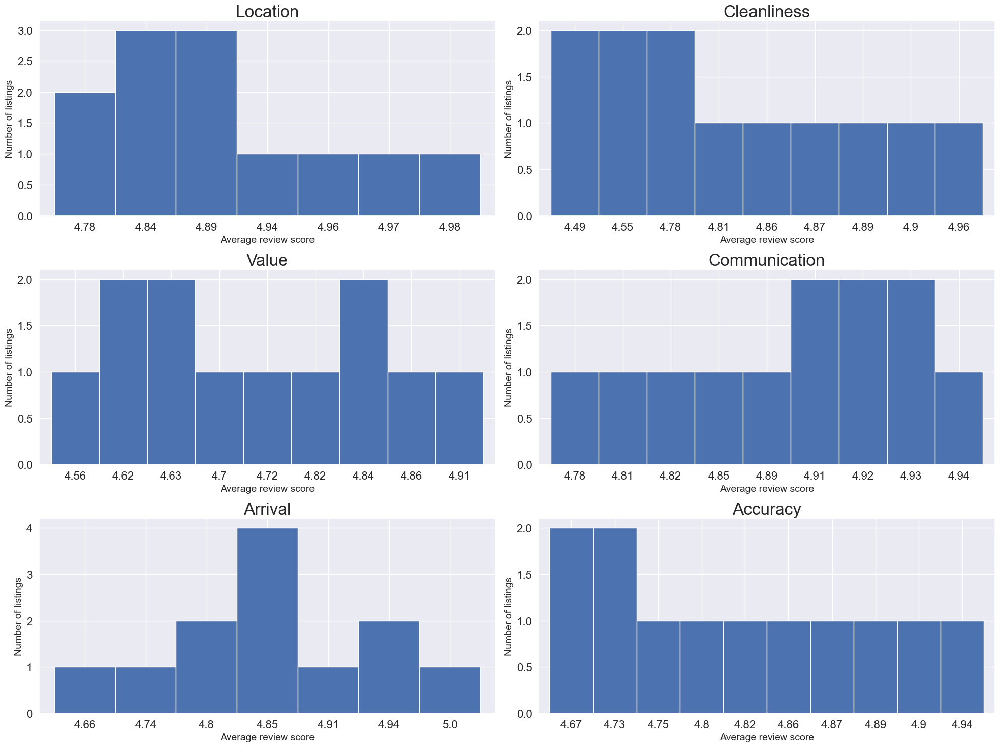

In [102]:
#Review Score
listings10 = df_gb[df_gb['number_of_reviews_ltm']>120]

fig = plt.figure(figsize=(20,15))
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16)

ax1 = fig.add_subplot(321)
feq=listings10['review_scores_location'].value_counts().sort_index()
ax1=feq.plot.bar(color='b', width=1, rot=0)
#ax1.tick_params(axis = 'both', labelsize = 16)
plt.title("Location", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax2 = fig.add_subplot(322)
feq=listings10['review_scores_cleanliness'].value_counts().sort_index()
ax2=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Cleanliness", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax3 = fig.add_subplot(323)
feq=listings10['review_scores_value'].value_counts().sort_index()
ax3=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Value", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax4 = fig.add_subplot(324)
feq=listings10['review_scores_communication'].value_counts().sort_index()
ax4=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Communication", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax5 = fig.add_subplot(325)
feq=listings10['review_scores_checkin'].value_counts().sort_index()
ax5=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Arrival", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

ax6 = fig.add_subplot(326)
feq=listings10['review_scores_accuracy'].value_counts().sort_index()
ax6=feq.plot.bar(color='b', width=1, rot=0)
plt.title("Accuracy", fontsize=24)
plt.ylabel('Number of listings', fontsize=14)
plt.xlabel('Average review score', fontsize=14)

plt.tight_layout()
plt.show()

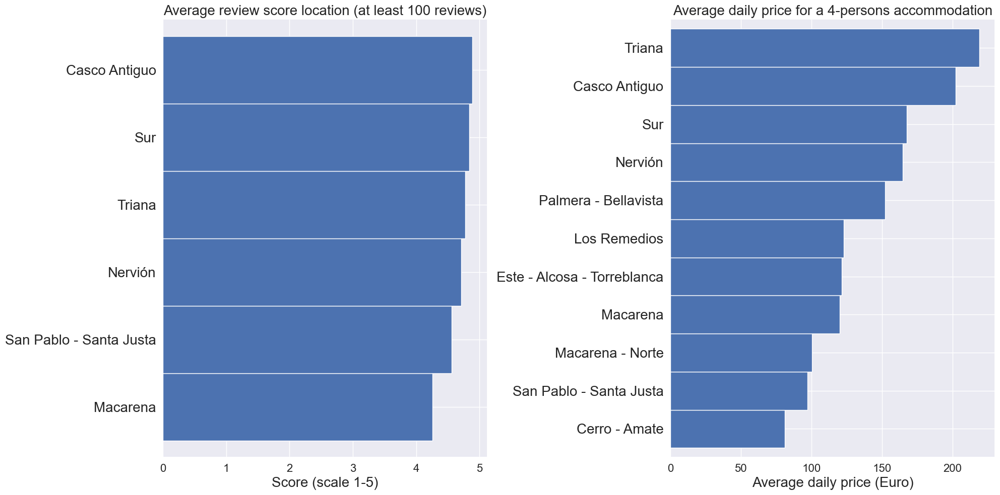

In [103]:
# Score  / Review
fig = plt.figure(figsize=(20,10))
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=20)

ax1 = fig.add_subplot(121)
feq = listings[listings['number_of_reviews_ltm']>=100]
feq1 = feq.groupby('neighbourhood_group')['review_scores_location'].mean().sort_values(ascending=True)
ax1=feq1.plot.barh(color='b', width=1)
plt.title("Average review score location (at least 100 reviews)", fontsize=20)
plt.xlabel('Score (scale 1-5)', fontsize=20)
plt.ylabel("")

ax2 = fig.add_subplot(122)
feq = listings[listings['accommodates']==4]
feq2 = feq.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=True)
ax2=feq2.plot.barh(color='b', width=1)
plt.title("Average daily price for a 4-persons accommodation", fontsize=20)
plt.xlabel('Average daily price (Euro)', fontsize=20)
plt.ylabel("")

plt.tight_layout()
plt.show()

REALMENTE IMPORTA SER SUPERHOST O NO EN EL CASCO ANTIGUO O EN TRIANA ?

In [104]:
# SuperHost
df_gb.host_is_superhost = df_gb.host_is_superhost.replace({"t": "True", "f": "False"})
feq=df_gb['host_is_superhost'].value_counts()
px.pie(feq ,names = feq.index, values=feq.values,width = 1000, template= "plotly_dark", title="Number of listings with Superhost")

In [105]:
#media de precios para super o no 
precio = df_gb.groupby('host_is_superhost')['price'].mean().sort_values(ascending = False)
dfprecio = pd.DataFrame(precio)
dfprecio = dfprecio.reset_index()
#ahora graficamos con plotly
px.bar(dfprecio, x="host_is_superhost", y="price",template= "plotly_dark", color='host_is_superhost',title = "Media de precios siendo superhost o no ")

In [106]:
#media de review para super o no 
precio = df_gb.groupby('host_is_superhost')['review_scores_value'].mean().sort_values(ascending = False)
dfprecio = pd.DataFrame(precio)
dfprecio = dfprecio.reset_index()
#ahora graficamos con plotly
px.bar(dfprecio, x="host_is_superhost", y="review_scores_value",template= "plotly_dark",color='host_is_superhost' ,title = "Media de review-score siendo superhost o no ")

Disponibilidad de las habitaciones en las fechas requeridas (24-dic hasta 03-jan)

In [118]:
#Disponibilidad general
sum_available = calendar[calendar.available == "t"].groupby(['date']).size().to_frame(name= 'available').reset_index()
sum_available['weekday'] = sum_available['date'].dt.day_name()
sum_available = sum_available.set_index('date')

sum_available.iplot(y='available', mode = 'lines', xTitle = 'Date', yTitle = 'number of listings available',\
                   text='weekday', title = 'Number of listings available by date')

In [107]:
#Disponibilidad en la semana
sum_available = calendar[calendar.available == "t"].groupby(['date']).size().to_frame(name= 'available').reset_index()
sum_available['weekday'] = sum_available['date'].dt.day_name()
sum_available = sum_available.set_index('date')

sum_available.iplot(y='available', mode = 'lines', xTitle = 'Date', yTitle = 'number of listings available',\
                   text='weekday', title = 'Number of listings available by date')

In [35]:
# Precio medio para las fechas dadas
precio = df_c.groupby('date')['price'].mean().sort_values(ascending = False)
dfprecio = pd.DataFrame(precio)
dfprecio = dfprecio.reset_index()
#ahora graficamos con plotly
px.bar(dfprecio, x="date", y="price",template= "plotly_dark", color='date',title = "Precio medio de las habitaciones disponibles en esas fechas")

In [36]:
#Precios visto de una "mejor" manera
df_media = df_c.groupby('date')['price'].mean().reset_index()
trace = go.Scatter(x=df_media['date'], y=df_media['price'], mode='lines+markers', name='Precios Medio')
layout = go.Layout(title='Media de Precios en la Fecha', xaxis=dict(title='Fecha'), yaxis=dict(title='Precio Medio'))
fig = go.Figure(data=[trace], layout=layout)
fig.show()

Que pasa con su seguridad ?

<img src="Img/compdesevilla.jpg">
 
 
 imagen tomada desde : "https://www.epdata.es/"

<img src="Img/comprobossevilla.jpg">
 
 
 imagen tomada desde : "https://www.epdata.es/"

In [37]:
#Crimenes en los ultimos tiempos (datos tomados desde 'estadisticasdecriminalidad.ses.mir.es')
from plotly.subplots import make_subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=("Hurtos", "Robos con violencia o intimidacion", "Robos con violencia en via publica", "Robos con fuerza en viviendas"))
fig.add_trace(go.Scatter(x=crim['Anho'], y=crim['Hurtos'], mode='lines+markers', name='Numero de hurtos'), row=1, col=1)
fig.add_trace(go.Scatter(x=crim['Anho'], y=crim['Robos con violencia o intimidacion'], mode='lines+markers', name='Numero de robos con violencia'), row=1, col=2)
fig.add_trace(go.Scatter(x=crim['Anho'], y=crim['Robos con violencia en via publica'], mode='lines+markers', name='Numero de robos en via publica'), row=2, col=1)
fig.add_trace(go.Scatter(x=crim['Anho'], y=crim['Robos con fuerza en viviendas'], mode='lines+markers', name='Numeor de robos en viviendas'), row=2, col=2)

# Personaliza la figura
fig.update_layout(title='Crimenes de importancia para un turista en pocos dias', showlegend=True)

# Muestra la figura
fig.show()

In [91]:
#Poligono Sur
df_sur= listings[(listings['neighbourhood_group'] == "Sur") ]
lats = df_sur['latitude'].tolist()
lons = df_sur['longitude'].tolist()
locations = list(zip(lats, lons))
map1 = folium.Map(location=[37.361096, -5.968047], zoom_start=14.)
FastMarkerCluster(data=locations).add_to(map1)
folium.Marker([37.359789, -5.963731], popup='Las 3000 Viviendas').add_to(map1)
map1

#### SEVILLA COMMENTS 👈(ﾟヮﾟ👈)

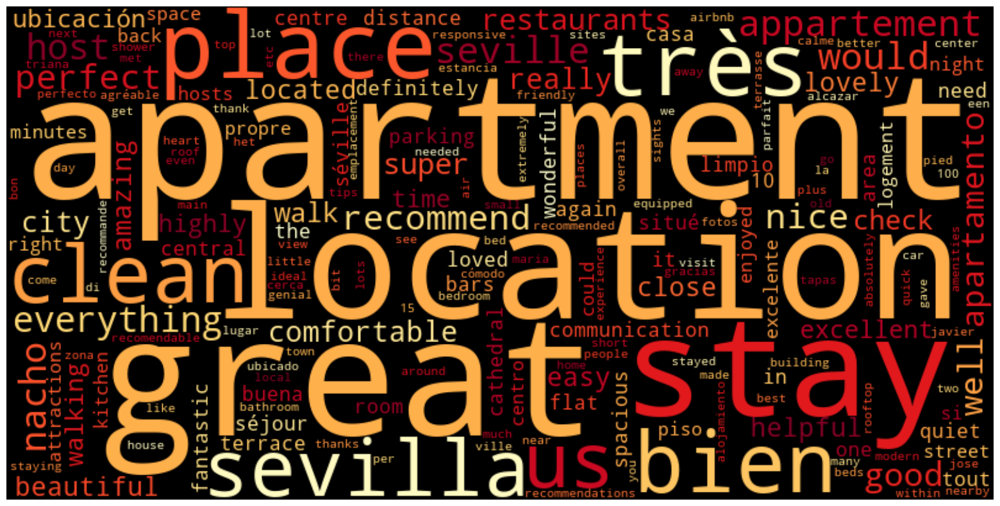

In [117]:
#COMMENTS
cvec_dict = dict(zip(cvec_df.words, cvec_df.counts))

wordcloud = WordCloud(width=800, height=400,colormap="YlOrRd")
wordcloud.generate_from_frequencies(frequencies=cvec_dict)
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

En Sevilla, su historia se fusiona con la vitalidad del presente, creando un destino único ; se caracteriza por el disfrute de las actividades al aire libre, propiciado por una agradable temperatura durante todo el año. Es una ciudad propicia para pasear, montar en bicicleta, disfrutar de sus parques y plazas o comer en una terraza. Despues de ver sus sitios mas famosos , la importancia que tienen la mayoria de lugares para historia española es increible , no es sorpresa que todos los que visiten sevilla dejen un trozo de su vida en ella .Es cierto que pudimos ver algunos ejemplos de criminalidad en auge en los ultimos años  , pero eso no deberia detener a nadie de visitar esta ciudad . Sevilla es uin lugar que merece ser explorado y vivido en su totalidad